# Momento 2 - Segmentacion ResNET32
Ariel Rodrigo Colque garcia

Dataset utilizado, imagenes segmentadas y su archivo .joson
[Dataset](https://drive.google.com/drive/folders/1lQCtowSgtu2LWYtgUT3ucVf5V_Nlgrwb?usp=drive_link)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Librerias

In [ ]:
from pycocotools.coco import COCO
from PIL import Image, ImageOps
import json
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import random
import torch
import torchvision
device = "cuda" if torch.cuda.is_available() else "cpu"

# Carga de Datos

In [ ]:
# Abrir el archivo JSON que contiene los datos de segmentación de objetos
cocofile = open("/content/drive/MyDrive/Data/2doParcial/JSON/segmentacion.json")

# Cargar el contenido del archivo JSON en la variable 'papel'
papel = json.load(cocofile)

# Acceder al primer elemento de la lista 'categories' en 'papel' y mostrarlo
papel['categories'][0]

# Acceder al primer elemento de la lista 'images' en 'papel' y mostrarlo
papel['images'][0]

# Acceder al primer elemento de la lista 'annotations' en 'papel' y mostrarlo
papel['annotations'][0]


{'id': 0,
 'image_id': 0,
 'category_id': 1,
 'bbox': [181, 176, 488, 321],
 'area': 156648,
 'segmentation': [[184.5,
   195,
   181,
   198.5,
   183,
   207.5,
   197,
   214.5,
   206,
   239.5,
   226.5,
   248,
   283.5,
   302,
   305.5,
   314,
   370,
   321.5,
   374,
   333.5,
   363,
   351.5,
   372,
   372.5,
   436.5,
   414,
   467,
   446.5,
   464,
   461.5,
   455.5,
   471,
   434,
   477.5,
   435,
   483.5,
   445.5,
   491,
   478.5,
   497,
   488,
   483.5,
   484,
   477.5,
   486.5,
   473,
   509.5,
   471,
   542.5,
   475,
   552.5,
   463,
   617.5,
   480,
   651.5,
   476,
   667,
   468.5,
   669,
   456.5,
   655.5,
   446,
   621.5,
   447,
   543.5,
   438,
   540,
   426.5,
   549,
   409.5,
   550,
   394.5,
   571,
   368.5,
   567.5,
   361,
   543.5,
   346,
   489.5,
   326,
   444.5,
   322,
   429.5,
   309,
   414.5,
   303,
   334.5,
   289,
   309.5,
   279,
   295,
   267.5,
   287,
   254.5,
   291,
   235.5,
   285,
   223.5,
   269.5,

In [ ]:
# Asignar el valor 10 a la variable 'image_id'
image_id = 10

# Crear una instancia de la clase 'COCO' y pasarle como argumento la ruta al archivo JSON de segmentación
coco_data = COCO("/content/drive/MyDrive/Data/2doParcial/JSON/segmentacion.json")

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!


In [ ]:
# Obtener la categoría con identificador 1 del conjunto de datos COCO cargado anteriormente
categoria = coco_data.cats[1]

# Mostrar la categoría obtenida
categoria

{'id': 1, 'name': 'papel', 'supercategory': 'trash-papers'}

In [ ]:
# Obtener el nombre de la categoría almacenada en la variable 'categoria'
label = categoria['name']

# Mostrar el nombre de la categoría
label

'papel'

In [ ]:
# Obtener la información de la imagen con el ID almacenado en la variable 'image_id'
img = coco_data.imgs[image_id]

# Mostrar la información de la imagen obtenida
img

{'id': 10,
 'license': 1,
 'file_name': 'papel-933-_jpg.rf.0251c00719007f15e02b951e3ce75784.jpg',
 'height': 600,
 'width': 800,
 'date_captured': '2023-06-02T12:52:51+00:00'}

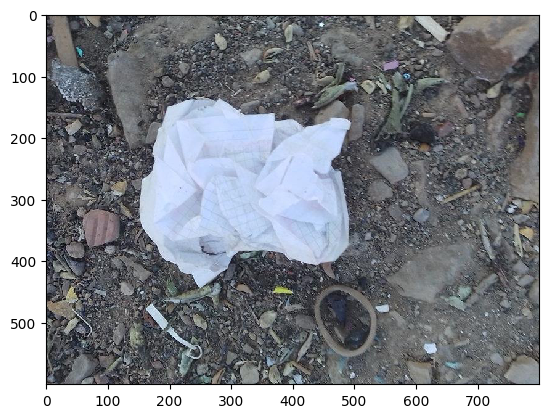

In [ ]:
# Cargar la imagen utilizando la ruta del archivo almacenada en el campo 'file_name' de la variable 'img',
# luego convertirla a formato RGB y almacenarla en la variable 'image'
image = np.array(Image.open("/content/drive/MyDrive/Data/2doParcial/Segmentacion/imagenes_segmentadas/" + img['file_name']).convert('RGB'))

# Mostrar la imagen utilizando matplotlib y la función 'imshow'
plt.imshow(image, interpolation='nearest')

# Mostrar la figura con la imagen
plt.show()

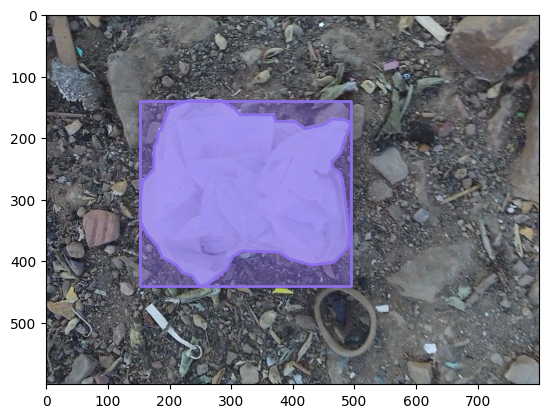

In [ ]:
# Mostrar la imagen utilizando matplotlib y la función 'imshow'
plt.imshow(image)

# Obtener los IDs de las categorías presentes en el conjunto de datos COCO
cat_ids = coco_data.getCatIds()

# Obtener los IDs de las anotaciones asociadas a la imagen actual (img['id']) y a las categorías especificadas (cat_ids)
anns_ids = coco_data.getAnnIds(imgIds=img['id'], catIds=cat_ids, iscrowd=None)

# Cargar las anotaciones correspondientes a los IDs obtenidos anteriormente
anns = coco_data.loadAnns(anns_ids)

# Mostrar las anotaciones en la imagen utilizando la función 'showAnns' de la instancia de la clase COCO
# Se activa la opción 'draw_bbox=True' para dibujar los cuadros delimitadores alrededor de los objetos
coco_data.showAnns(anns, draw_bbox=True)

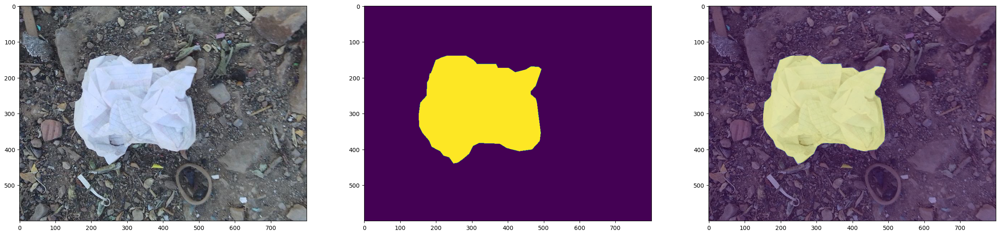

In [ ]:
# Obtener la máscara correspondiente a la primera anotación en 'anns' y almacenarla en 'mask'
mask = coco_data.annToMask(anns[0])

# Iterar sobre el resto de anotaciones en 'anns' y sumar las máscaras correspondientes a 'mask'
for i in range(len(anns)):
    mask += coco_data.annToMask(anns[i])

# Crear una figura con tres subfiguras utilizando 'subplots'
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,10))

# Mostrar la imagen original en la primera subfigura
ax1.imshow(image)

# Mostrar la máscara en la segunda subfigura
ax2.imshow(mask)

# Mostrar la imagen original en la tercera subfigura
ax3.imshow(image)

# Superponer la máscara con una transparencia del 40% en la tercera subfigura
ax3.imshow(mask, alpha=0.4)

# Mostrar la figura con las subfiguras
plt.show()

In [ ]:
# Obtener la máscara correspondiente a la primera anotación
mask = coco_data.annToMask(anns[0])

# Obtener la forma de la máscara
mask.shape

(600, 800)

In [ ]:
# Obtener la máscara correspondiente a la primera anotación
mask = coco_data.annToMask(anns[0])

# Obtener el valor máximo en la imagen y Obtener la forma de la máscara y 
mask.shape, image.max()


((600, 800), 255)

In [ ]:
image_id=2
coco_data=COCO("/content/drive/MyDrive/Data/2doParcial/JSON/segmentacion.json")

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


In [ ]:
from random import sample
import numpy as np
from PIL import Image
from pycocotools.coco import COCO

def combine_masks(anns, dataset_coco):
    # Crear una máscara inicial de ceros con las dimensiones de la imagen
    mask = np.zeros((dataset_coco.imgs[anns[0]['image_id']]['height'], dataset_coco.imgs[anns[0]['image_id']]['width']), dtype=np.uint8)
    
    # Combinar las máscaras de todas las anotaciones sumándolas
    for ann in anns:
        mask += dataset_coco.annToMask(ann)
    
    return mask

def loadImages(dataset_coco, split=0.1):
  
    img_test_ = []
    img_train_ = []
    labels_test_ = []
    labels_train_ = []
    
    # Obtener la información de todas las imágenes del conjunto de datos COCO
    data_ = dataset_coco.imgs
    
    # Calcular el número de imágenes y el número de imágenes de prueba
    num_images = len(data_)
    num_test = int(num_images * split)
    
    # Obtener los IDs de las imágenes de prueba de forma aleatoria
    test_ids = sample(list(data_), num_test)
    
    # Iterar sobre las imágenes en 'data_'
    for i in data_:
        img_ = data_[i]
        
        # Obtener la ruta de la imagen
        image_path = "/content/drive/MyDrive/Data/2doParcial/Segmentacion/imagenes_segmentadas/" + img_['file_name']
        
        # Cargar la imagen y convertirla a formato RGB
        image_load_ = Image.open(image_path).convert('RGB')
        image_ = np.array(image_load_) / 255
        
        # Obtener los IDs de las anotaciones asociadas a la imagen
        ann_ids = dataset_coco.getAnnIds(imgIds=img_['id'])
        
        # Cargar las anotaciones asociadas a la imagen
        anns_ = dataset_coco.loadAnns(ann_ids)
        
        # Combinar las máscaras de las anotaciones en una única máscara
        mask_ = combine_masks(anns_, dataset_coco)
        
        # Agregar la imagen y la máscara a las listas correspondientes de prueba o entrenamiento
        if i in test_ids:
            img_test_.append(image_path)
            labels_test_.append(mask_)
        else:
            img_train_.append(image_path)
            labels_train_.append(mask_)
    
    # Devolver los datos de entrenamiento y prueba como arrays numpy
    return np.array(img_train_), np.array(img_test_), np.array(labels_train_), np.array(labels_test_)

In [ ]:
# Llamar a la función 'loadImages' para obtener los conjuntos de imágenes y máscaras de entrenamiento y prueba,
# así como las etiquetas de entrenamiento y prueba
img_train, img_test, labels_train, labels_test = loadImages(coco_data, split=0.1)

In [ ]:
img_train.shape, img_test.shape , len(labels_train), len(labels_test)

((900,), (99,), 900, 99)

In [ ]:
import albumentations as A
from skimage import io
from skimage import color

class Dataset(torch.utils.data.Dataset):
    def __init__(self, X, y, n_classes=3, transform=None):
        # Inicialización de la clase del conjunto de datos
        self.X = X  # Lista de rutas de las imágenes
        self.y = y  # Lista de etiquetas de las máscaras correspondientes
        self.n_classes = n_classes  # Número de clases
        self.transform = transform  # Transformación opcional a aplicar

    def __len__(self):
        # Devuelve la longitud del conjunto de datos (número de muestras)
        return len(self.X)

    def __getitem__(self, ix):
        # Obtiene una muestra específica del conjunto de datos

        # Cargar imagen y convertir a formato adecuado
        img = io.imread(self.X[ix])
        
        # Comprobar si la imagen tiene 4 canales (RGBA) y convertirla a RGB si es necesario
        if img.shape[2] == 4:
            img = color.rgba2rgb(img)
        
        # Normalizar la imagen dividiendo entre 255
        image = np.array(img) / 255
        img = image.astype(np.float32)

        # Obtener máscara correspondiente y convertir etiquetas a one-hot encoding
        mask = self.y[ix]
        img = torch.from_numpy(img).permute(2, 0, 1)
        mask = (np.arange(self.n_classes) == mask[..., None]).astype(np.float32)

        if self.transform is not None:
            # Aplicar transformación adicional a la imagen y la máscara si está disponible
            img = img.permute(1, 2, 0).numpy()  # Convertir de nuevo a NumPy
            
            augmented = self.transform(image=img, mask=mask)  # Aplicar transformación utilizando la biblioteca albumentations
            
            img = augmented['image']  # Obtener la imagen transformada
            mask = augmented['mask']  # Obtener la máscara transformada
            
            img = torch.from_numpy(img).permute(2, 0, 1)  # Convertir la imagen a tensor y permutar dimensiones

        return img, torch.from_numpy(mask).permute(2, 0, 1)  # Devolver la imagen y la máscara como tensores

In [ ]:
trans = A.Compose([
    A.Resize(394, 394)  # Transformación para redimensionar las imágenes y máscaras
])

dataset = {
    'train': Dataset(img_train, labels_train, transform=trans),  # Crear instancia del conjunto de datos de entrenamiento con transformación
    'test': Dataset(img_test, labels_test)  # Crear instancia del conjunto de datos de prueba sin transformación
}

len(dataset['train']), len(dataset['test'])  # Obtener la longitud de los conjuntos de datos de entrenamiento y prueba

(900, 99)

In [ ]:
dataset['train'][0]

(tensor([[[0.4228, 0.4066, 0.4019,  ..., 0.3963, 0.4627, 0.4462],
          [0.4648, 0.4801, 0.4668,  ..., 0.3485, 0.4539, 0.5244],
          [0.5110, 0.5500, 0.5787,  ..., 0.5449, 0.5239, 0.4932],
          ...,
          [0.6301, 0.6473, 0.6921,  ..., 0.6414, 0.6666, 0.6203],
          [0.5351, 0.5398, 0.5541,  ..., 0.6267, 0.6779, 0.6082],
          [0.5246, 0.5146, 0.4931,  ..., 0.6103, 0.6551, 0.5714]],
 
         [[0.4149, 0.3988, 0.3895,  ..., 0.3963, 0.4666, 0.4501],
          [0.4570, 0.4723, 0.4545,  ..., 0.3485, 0.4579, 0.5283],
          [0.5032, 0.5422, 0.5663,  ..., 0.5442, 0.5239, 0.4959],
          ...,
          [0.5477, 0.5699, 0.6188,  ..., 0.5888, 0.6099, 0.5693],
          [0.4488, 0.4600, 0.4796,  ..., 0.5741, 0.6212, 0.5572],
          [0.4383, 0.4332, 0.4156,  ..., 0.5576, 0.5984, 0.5204]],
 
         [[0.4189, 0.4027, 0.3934,  ..., 0.2910, 0.3433, 0.3178],
          [0.4609, 0.4762, 0.4584,  ..., 0.2432, 0.3359, 0.4020],
          [0.5071, 0.5461, 0.5702,  ...,

In [ ]:
dataloader = {
    'train': torch.utils.data.DataLoader(dataset['train'], batch_size=10, shuffle=True, pin_memory=True),  # DataLoader para el conjunto de datos de entrenamiento
    'test': torch.utils.data.DataLoader(dataset['test'], batch_size=10, pin_memory=True)  # DataLoader para el conjunto de datos de prueba
}

imgs, masks = next(iter(dataloader['train']))  # Obtener el primer lote de imágenes y máscaras del conjunto de datos de entrenamiento
imgs.shape, masks.shape  # Obtener las dimensiones de las imágenes y máscaras


(torch.Size([10, 3, 394, 394]), torch.Size([10, 3, 394, 394]))

# one-hot encoding

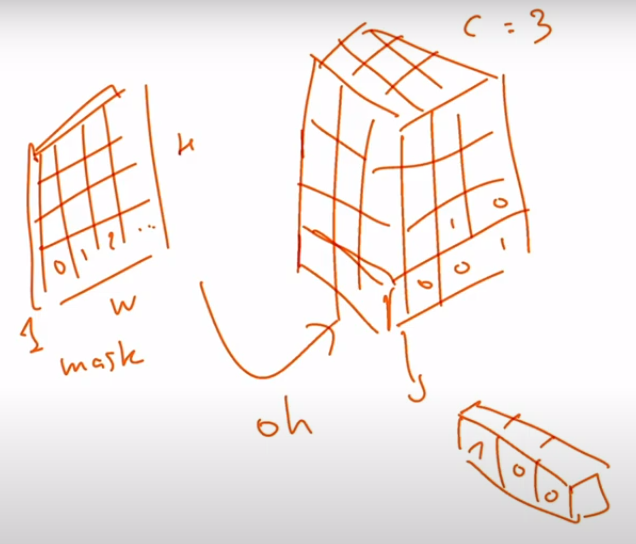

In [ ]:
mask_oh = (np.arange(3) == mask[...,None]).astype(np.float32) 

mask_oh.shape, mask_oh.dtype, mask_oh.max(), mask_oh.min()

((600, 800, 3), dtype('float32'), 1.0, 0.0)

# UNET

In [ ]:
import torch.nn.functional as F

def conv3x3_bn(ci, co):
    # Definición de una capa de convolución 3x3 seguida de BatchNormalization y ReLU
    return torch.nn.Sequential(
        torch.nn.Conv2d(ci, co, 3, padding=1),  # Capa de convolución 3x3 con padding de 1, no cambiamos la dimension
        torch.nn.BatchNorm2d(co),  # Capa de BatchNormalization para normalizar los valores de salida
        torch.nn.ReLU(inplace=True)  # Función de activación ReLU para introducir no linealidad
    )

In [ ]:
def encoder_conv(ci, co):
    # Definición de una capa de codificación que consiste en MaxPool2d seguido de dos capas conv3x3_bn
    return torch.nn.Sequential(
        torch.nn.MaxPool2d(2),  # Capa de MaxPool2d para reducir la resolución espacial a la mitad, cambia la dimension
        conv3x3_bn(ci, co),  # Capa conv3x3_bn con ci canales de entrada y co canales de salida
        conv3x3_bn(co, co)  # Capa conv3x3_bn con co canales de entrada y co canales de salida
    )

In [ ]:
class deconv(torch.nn.Module):
    def __init__(self, ci, co):
        super(deconv, self).__init__()
        self.upsample = torch.nn.ConvTranspose2d(ci, co, 2, stride=2)  # Capa de upsampling utilizando ConvTranspose2d
        self.conv1 = conv3x3_bn(ci, co)  # Capa conv3x3_bn con ci canales de entrada y co canales de salida
        self.conv2 = conv3x3_bn(co, co)  # Capa conv3x3_bn con co canales de entrada y co canales de salida
    
    def forward(self, x1, x2): # x1 la salida de la capa anterior y x2 capas resoduales
        # Método forward para la capa de deconvolución
        
        x1 = self.upsample(x1)  # Upsampling de x1 utilizando la capa de ConvTranspose2d
        diffX = x2.size()[2] - x1.size()[2]  # Calculamos la diferencia en el tamaño de la dimensión X
        diffY = x2.size()[3] - x1.size()[3]  # Calculamos la diferencia en el tamaño de la dimensión Y
        x1 = F.pad(x1, (diffX, 0, diffY, 0))  # Aplicamos padding a x1 para que tenga el mismo tamaño que x2
        
        x = torch.cat([x2, x1], dim=1)  # Concatenamos los tensores x2 y x1 a lo largo de la dimensión 1
        x = self.conv1(x)  # Aplicamos la primera capa conv3x3_bn a la concatenación
        x = self.conv2(x)  # Aplicamos la segunda capa conv3x3_bn a la salida de la primera capa
        
        return x

In [ ]:
class UNet(torch.nn.Module):
    def __init__(self, n_classes=3, in_ch=3):
        super().__init__()

        # Lista de capas en el encoder-decoder con número de filtros
        c = [16, 32, 64, 128]

        # Primera capa conv que recibe la imagen
        self.conv1 = torch.nn.Sequential(
            conv3x3_bn(in_ch, c[0]),  # Capa conv3x3_bn con in_ch canales de entrada y c[0] canales de salida
            conv3x3_bn(c[0], c[0])  # Capa conv3x3_bn con c[0] canales de entrada y c[0] canales de salida
        )

        # Capas del encoder
        self.conv2 = encoder_conv(c[0], c[1])  # Capa encoder con c[0] canales de entrada y c[1] canales de salida
        self.conv3 = encoder_conv(c[1], c[2])  # Capa encoder con c[1] canales de entrada y c[2] canales de salida
        self.conv4 = encoder_conv(c[2], c[3])  # Capa encoder con c[2] canales de entrada y c[3] canales de salida

        # Capas del decoder
        self.deconv1 = deconv(c[3], c[2])  # Capa de deconvolución con c[3] canales de entrada y c[2] canales de salida
        self.deconv2 = deconv(c[2], c[1])  # Capa de deconvolución con c[2] canales de entrada y c[1] canales de salida
        self.deconv3 = deconv(c[1], c[0])  # Capa de deconvolución con c[1] canales de entrada y c[0] canales de salida

        # Última capa conv que produce la máscara
        self.out = torch.nn.Conv2d(c[0], n_classes, 3, padding=1)  # Capa conv2d con c[0] canales de entrada, n_classes canales de salida y tamaño de kernel 3x3 con padding 1

    def forward(self, x):
        # Método forward para el modelo UNet

        # Encoder
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        x3 = self.conv3(x2)
        x = self.conv4(x3)

        # Decoder
        x = self.deconv1(x, x3)
        x = self.deconv2(x, x2)
        x = self.deconv3(x, x1)

        x = self.out(x)  # Última capa conv que produce la máscara

        return x

In [ ]:
model = UNet()  # Creamos una instancia del modelo UNet
output = model(torch.randn((1, 3, 394, 394)))  # Ejecutamos un pase hacia adelante del modelo con un tensor de ejemplo
output.shape  # Obtenemos la forma del resultado

torch.Size([1, 3, 394, 394])

#IoU

In [ ]:
def iou(outputs, labels):
    # Aplicar sigmoid y convertir a binario
    outputs, labels = torch.sigmoid(outputs) > 0.5, labels > 0.5

    SMOOTH = 1e-6
    # BATCH x num_classes x H x W
    B, N, H, W = outputs.shape
    ious = []

    for i in range(N-1):  # Saltamos el fondo (background)
        _out, _labs = outputs[:, i, :, :], labels[:, i, :, :]
        intersection = (_out & _labs).float().sum((1, 2))
        union = (_out | _labs).float().sum((1, 2))
        iou = (intersection + SMOOTH) / (union + SMOOTH)
        ious.append(iou.mean().item())

    return np.mean(ious)

In [ ]:
from tqdm import tqdm

def fit(model, dataloader, epochs=100, lr=3e-4):
    # Definir el optimizador y la función de pérdida
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.BCEWithLogitsLoss()
# Se usa BCEWithLogitsLoss en segmentación porque es una función de pérdida adecuada
#  para problemas de clasificación binaria con salidas de tipo logit. Un logit  
    model.to(device)

    # Historial de métricas
    hist = {'loss': [], 'iou': [], 'test_loss': [], 'test_iou': []}

    for epoch in range(1, epochs+1):
        # Entrenamiento
        bar = tqdm(dataloader['train'])
        train_loss, train_iou = [], []
        model.train()

        for imgs, masks in bar:
            # Mover las imágenes y máscaras al dispositivo (por ejemplo, GPU)
            imgs, masks = imgs.to(device), masks.to(device)

            # Reiniciar los gradientes acumulados en el optimizador
            optimizer.zero_grad()

            # Obtener las predicciones del modelo
            y_hat = model(imgs)

            # Calcular la pérdida usando la función de pérdida definida
            loss = criterion(y_hat, masks)

            # Calcular el gradiente de la pérdida
            loss.backward()

            # Actualizar los parámetros del modelo utilizando el optimizador
            optimizer.step()

            # Calcular la métrica IOU
            ious = iou(y_hat, masks)

            # Agregar la pérdida y la métrica IOU al historial
            train_loss.append(loss.item())
            train_iou.append(ious)

            # Actualizar la barra de progreso
            bar.set_description(f"loss {np.mean(train_loss):.5f} iou {np.mean(train_iou):.5f}")

        # Agregar las métricas promedio del entrenamiento al historial
        hist['loss'].append(np.mean(train_loss))
        hist['iou'].append(np.mean(train_iou))

        # Evaluación
        bar = tqdm(dataloader['test'])
        test_loss, test_iou = [], []
        model.eval()

        with torch.no_grad():
            for imgs, masks in bar:
                # Mover las imágenes y máscaras al dispositivo (por ejemplo, GPU)
                imgs, masks = imgs.to(device), masks.to(device)

                # Obtener las predicciones del modelo
                y_hat = model(imgs)

                # Calcular la pérdida utilizando la función de pérdida definida
                loss = criterion(y_hat, masks)

                # Calcular la métrica IOU
                ious = iou(y_hat, masks)

                # Agregar la pérdida y la métrica IOU al historial
                test_loss.append(loss.item())
                test_iou.append(ious)

                # Actualizar la barra de progreso
                bar.set_description(f"test_loss {np.mean(test_loss):.5f} test_iou {np.mean(test_iou):.5f}")

        # Agregar las métricas promedio de la evaluación al historial
        hist['test_loss'].append(np.mean(test_loss))
        hist['test_iou'].append(np.mean(test_iou))

        # Imprimir las métricas del epoch actual
        print(f"\nEpoch {epoch}/{epochs} loss {np.mean(train_loss):.5f} iou {np.mean(train_iou):.5f} test_loss {np.mean(test_loss):.5f} test_iou {np.mean(test_iou):.5f}")

    return hist


# Transfer Learning

In [ ]:
import torch.nn.functional as F

class deconv(torch.nn.Module):
    def __init__(self, ci, co):
        super(deconv, self).__init__()
        self.upsample = torch.nn.ConvTranspose2d(ci, co, 2, stride=2)
        self.conv1 = conv3x3_bn(ci, co)
        self.conv2 = conv3x3_bn(co, co)
    
    def forward(self, x1, x2):
        x1 = self.upsample(x1)  # Realizar upsampling de x1
        x1 = F.interpolate(x1, size=x2.size()[2:], mode='bilinear', align_corners=False)  # Redimensionar x1 al tamaño de x2 utilizando interpolación bilineal
        x = torch.cat([x2, x1], dim=1)  # Concatenar los tensores x2 y x1 a lo largo de la dimensión 1
        x = self.conv1(x)  # Aplicar la primera capa convolucional a la concatenación
        x = self.conv2(x)  # Aplicar la segunda capa convolucional a la salida anterior
        return x

In [ ]:
class out_conv(torch.nn.Module):
    def __init__(self, ci, co, coo):
        super(out_conv, self).__init__()
        self.upsample = torch.nn.ConvTranspose2d(ci, co, 2, stride=2)
        self.conv = conv3x3_bn(ci, co)
        self.final = torch.nn.Conv2d(co, coo, 1)

    def forward(self, x1, x2):
        x1 = self.upsample(x1)  # Realizar upsampling de x1
        diffX = x2.size()[2] - x1.size()[2]  # Calcular la diferencia en tamaño entre x2 y x1 en la dimensión X
        diffY = x2.size()[3] - x1.size()[3]  # Calcular la diferencia en tamaño entre x2 y x1 en la dimensión Y
        x1 = F.pad(x1, (diffX, 0, diffY, 0))  # Rellenar x1 con ceros para que tenga el mismo tamaño que x2
        x = self.conv(x1)  # Aplicar la capa convolucional a x1
        x = self.final(x)  # Aplicar la última capa convolucional para obtener la salida final
        return x


# RESNET101

No funciona

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models

class UNetResnet0(nn.Module):
    def __init__(self, n_classes=3, in_ch=3):
        super(UNetResnet, self).__init__()

        # Definir el encoder utilizando el modelo pre-entrenado resnet34
        self.encoder = models.resnet34(pretrained=True)

        # Modificar la primera capa convolucional del encoder si el número de canales de entrada es diferente de 3
        if in_ch != 3:
            self.encoder.conv1 = nn.Conv2d(in_ch, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Definir las capas de de convolución
        self.deconv1 = deconv(512, 256)
        self.deconv2 = deconv(256, 128)
        self.deconv3 = deconv(128, 64)

        # Definir la capa de salida
        self.out = out_conv(64, 64, n_classes)

    def forward(self, x):
        # Crear una copia de la entrada original
        x_in = torch.tensor(x.clone())

        # Aplicar la primera capa convolucional, la función de activación ReLU y la capa de normalización
        x = self.encoder.relu(self.encoder.bn1(self.encoder.conv1(x)))

        # Aplicar las capas del bloque residual 1
        x1 = self.encoder.layer1(x)

        # Aplicar las capas del bloque residual 2
        x2 = self.encoder.layer2(x1)

        # Aplicar las capas del bloque residual 3
        x3 = self.encoder.layer3(x2)

        # Aplicar las capas del bloque residual 4
        x = self.encoder.layer4(x3)

        # Aplicar las capas de deconvolución en orden inverso
        x = self.deconv1(x, x3)
        x = self.deconv2(x, x2)
        x = self.deconv3(x, x1)

        # Aplicar la capa de salida
        x = self.out(x, x_in)

        # Retornar el resultado
        return x

In [ ]:
model = UNetResnet0()
output = model(torch.randn((1, 3, 394, 394)))
print(output.shape)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:00<00:00, 299MB/s]
<ipython-input-44-aaa4b7fde893>:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True)

torch.Size([1, 3, 394, 394])


In [ ]:
#model = UNet()
# hist = fit(model, dataloader, epochs=10)

  0%|          | 0/90 [00:00<?, ?it/s]<ipython-input-44-aaa4b7fde893>:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_in = torch.tensor(x.clone())
  0%|          | 0/90 [00:07<?, ?it/s]


OutOfMemoryError: ignored

# RESNET34

Algunas de las características más relevantes de ResNet34 son:

Es una red neuronal convolucional profunda con 34 capas de convolución.
Usa conexiones residuales que saltan algunas capas y suman la entrada con la salida de una serie de capas.

Resuelve el problema del degradado del gradiente y permite entrenar redes más profundas y precisas.

Tiene una estructura modular basada en unidades residuales, que son bloques de dos capas de convolución con una conexión residual.

Reduce el tamaño de la entrada y aumenta el número de canales cada vez que cambia de bloque, usando un stride de 2 en la primera capa de cada unidad residual.

Tiene una capa inicial de convolución con un kernel de 7x7 y un stride de 2, seguida por una capa de pooling máximo con un kernel de 3x3 y un stride de 2.

Tiene una capa lineal con 1000 unidades de salida y una función softmax para predecir las probabilidades de las 1000 clases del conjunto de datos ImageNet.

Tiene 21.8 millones de parámetros y alcanza un error top-1 del 26.70% y un error top-5 del 8.58% en el conjunto de datos ImageNet-1k.

Se puede usar como una columna vertebral para otras tareas de visión computacional, como detección o segmentación.



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models

class UNetResnet(nn.Module):
    def __init__(self, n_classes=3, in_ch=3):
        super(UNetResnet, self).__init__()

        # Definir el encoder utilizando el modelo pre-entrenado resnet34
        self.encoder = models.resnet34(pretrained=True)

        # Modificar la primera capa convolucional del encoder si el número de canales de entrada es diferente de 3
        if in_ch != 3:
            self.encoder.conv1 = nn.Conv2d(in_ch, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Definir las capas de deconvolución
        self.deconv1 = deconv(512, 256)
        self.deconv2 = deconv(256, 128)
        self.deconv3 = deconv(128, 64)

        # Definir la capa de salida
        self.out = out_conv(64, 64, n_classes)

    def forward(self, x):
        # Crear una copia de la entrada original
        x_in = torch.tensor(x.clone())
        # print(x_in)

        # Aplicar la primera capa convolucional, la función de activación ReLU y la capa de normalización
        x = self.encoder.relu(self.encoder.bn1(self.encoder.conv1(x)))
        # print(x)

        # Aplicar las capas del bloque residual 1
        x1 = self.encoder.layer1(x)
        # print(x1)

        # Aplicar las capas del bloque residual 2
        x2 = self.encoder.layer2(x1)
        # print(x2)

        # Aplicar las capas del bloque residual 3
        x3 = self.encoder.layer3(x2)
        # print(x3)

        # Aplicar las capas del bloque residual 4
        x = self.encoder.layer4(x3)
        # print(x)

        # Aplicar las capas de deconvolución en orden inverso
        x = self.deconv1(x, x3)
        x = self.deconv2(x, x2)
        x = self.deconv3(x, x1)
        # print(x)

        # Aplicar la capa de salida
        x = self.out(x, x_in)
        # print(x)

        # Retornar el resultado
        return x

In [ ]:
model = UNetResnet()  # Creamos una instancia del modelo UNet
output = model(torch.randn((1, 3, 394, 394)))  # Ejecutamos un pase hacia adelante del modelo con un tensor de ejemplo
output.shape  # Obtenemos la forma del resultado

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 242MB/s]
<ipython-input-31-f5466e2ba607>:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

torch.Size([1, 3, 394, 394])

In [ ]:
hist = fit(model, dataloader, epochs=30)

  0%|          | 0/90 [00:00<?, ?it/s]<ipython-input-31-f5466e2ba607>:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_in = torch.tensor(x.clone())
test_loss 0.32113 test_iou 0.63580: 100%|██████████| 10/10 [00:12<00:00,  1.25s/it]



Epoch 1/30 loss 0.40075 iou 0.84462 test_loss 0.32113 test_iou 0.63580


test_loss 0.24800 test_iou 0.60519: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 2/30 loss 0.23142 iou 0.91443 test_loss 0.24800 test_iou 0.60519


test_loss 0.12953 test_iou 0.91116: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 3/30 loss 0.14551 iou 0.93019 test_loss 0.12953 test_iou 0.91116


test_loss 0.11372 test_iou 0.88082: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 4/30 loss 0.09900 iou 0.93166 test_loss 0.11372 test_iou 0.88082


test_loss 0.07745 test_iou 0.90718: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 5/30 loss 0.07068 iou 0.94297 test_loss 0.07745 test_iou 0.90718


test_loss 0.12558 test_iou 0.59794: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 6/30 loss 0.05522 iou 0.94503 test_loss 0.12558 test_iou 0.59794


test_loss 0.06768 test_iou 0.89252: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 7/30 loss 0.04408 iou 0.94950 test_loss 0.06768 test_iou 0.89252


test_loss 0.06638 test_iou 0.88905: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 8/30 loss 0.03748 iou 0.95354 test_loss 0.06638 test_iou 0.88905


test_loss 0.05787 test_iou 0.91269: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 9/30 loss 0.03422 iou 0.94860 test_loss 0.05787 test_iou 0.91269


test_loss 0.06290 test_iou 0.86518: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 10/30 loss 0.03150 iou 0.94916 test_loss 0.06290 test_iou 0.86518


test_loss 0.08696 test_iou 0.70949: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 11/30 loss 0.02537 iou 0.95943 test_loss 0.08696 test_iou 0.70949


test_loss 0.09047 test_iou 0.72307: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 12/30 loss 0.02222 iou 0.96431 test_loss 0.09047 test_iou 0.72307


test_loss 0.05990 test_iou 0.87409: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 13/30 loss 0.02005 iou 0.96669 test_loss 0.05990 test_iou 0.87409


test_loss 0.04798 test_iou 0.92141: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 14/30 loss 0.01960 iou 0.96506 test_loss 0.04798 test_iou 0.92141


test_loss 0.04494 test_iou 0.93113: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 15/30 loss 0.01748 iou 0.96776 test_loss 0.04494 test_iou 0.93113


test_loss 0.04981 test_iou 0.91540: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 16/30 loss 0.01662 iou 0.96777 test_loss 0.04981 test_iou 0.91540


test_loss 0.07469 test_iou 0.84364: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 17/30 loss 0.01637 iou 0.96620 test_loss 0.07469 test_iou 0.84364


test_loss 0.11647 test_iou 0.61761: 100%|██████████| 10/10 [00:12<00:00,  1.25s/it]



Epoch 18/30 loss 0.01728 iou 0.96302 test_loss 0.11647 test_iou 0.61761


test_loss 0.04062 test_iou 0.92277: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 19/30 loss 0.01867 iou 0.95919 test_loss 0.04062 test_iou 0.92277


test_loss 0.05510 test_iou 0.91867: 100%|██████████| 10/10 [00:12<00:00,  1.28s/it]



Epoch 20/30 loss 0.01481 iou 0.96655 test_loss 0.05510 test_iou 0.91867


test_loss 0.05274 test_iou 0.88406: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 21/30 loss 0.01420 iou 0.96754 test_loss 0.05274 test_iou 0.88406


test_loss 0.06605 test_iou 0.84238: 100%|██████████| 10/10 [00:12<00:00,  1.28s/it]



Epoch 22/30 loss 0.01283 iou 0.96809 test_loss 0.06605 test_iou 0.84238


test_loss 0.03458 test_iou 0.93619: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 23/30 loss 0.01151 iou 0.97046 test_loss 0.03458 test_iou 0.93619


test_loss 0.07722 test_iou 0.85546: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 24/30 loss 0.01187 iou 0.96997 test_loss 0.07722 test_iou 0.85546


test_loss 0.05321 test_iou 0.91102: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 25/30 loss 0.01100 iou 0.97069 test_loss 0.05321 test_iou 0.91102


test_loss 0.05918 test_iou 0.87924: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 26/30 loss 0.01029 iou 0.97248 test_loss 0.05918 test_iou 0.87924


test_loss 0.05073 test_iou 0.89386: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]



Epoch 27/30 loss 0.00943 iou 0.97233 test_loss 0.05073 test_iou 0.89386


test_loss 0.05440 test_iou 0.89838: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 28/30 loss 0.00872 iou 0.97451 test_loss 0.05440 test_iou 0.89838


test_loss 0.05413 test_iou 0.88888: 100%|██████████| 10/10 [00:12<00:00,  1.26s/it]



Epoch 29/30 loss 0.01000 iou 0.97060 test_loss 0.05413 test_iou 0.88888


test_loss 0.10805 test_iou 0.72191: 100%|██████████| 10/10 [00:12<00:00,  1.27s/it]


Epoch 30/30 loss 0.01559 iou 0.95943 test_loss 0.10805 test_iou 0.72191


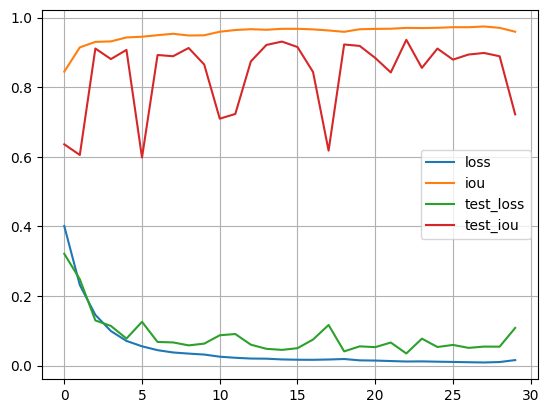

In [ ]:
import pandas as pd
df = pd.DataFrame(hist)
df.plot(grid=True)
plt.show()

In [ ]:
import torch
# Supongamos que tienes un modelo llamado 'model' entrenado y deseas guardarlo
torch.save(model.state_dict(), 'resnet34.pth')

In [ ]:
# Crear una instancia del modelo
resnet34 = UNetResnet()
# Cargar los parámetros del modelo guardado en la instancia
resnet34.load_state_dict(torch.load('/content/resnet34.pth'))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

# Mostrar imagenes Predichas

In [ ]:
# Definición de la función para visualizar la predicción
# Parámetros:
# - img: Imagen original
# - mask_predicha: Máscara predicha
def visualizar_prediccion(img, mask_predicha):
    # Configurar la transparencia y el color de la máscara
    colors = [(1, 1, 0, 0), (1, 1, 0, 0.4)]
    cmap = LinearSegmentedColormap.from_list('CustomYellow', colors)
    
    # Crear una figura con tres subfiguras
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))
    
    # Mostrar la imagen original en la primera subfigura
    ax1.imshow(img)
    ax1.set_title('Imagen Original')

    # Mostrar la máscara predicha en la segunda subfigura
    ax2.imshow(mask_predicha)
    ax2.set_title('Máscara Predicha')

    # Mostrar la imagen original y la máscara predicha combinadas en la tercera subfigura
    ax3.imshow(img)
    ax3.imshow(mask_predicha, cmap=cmap)
    ax3.set_title('Máscara Con la Imagen Original')

    # Mostrar la figura completa
    plt.show()

<ipython-input-31-f5466e2ba607>:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_in = torch.tensor(x.clone())


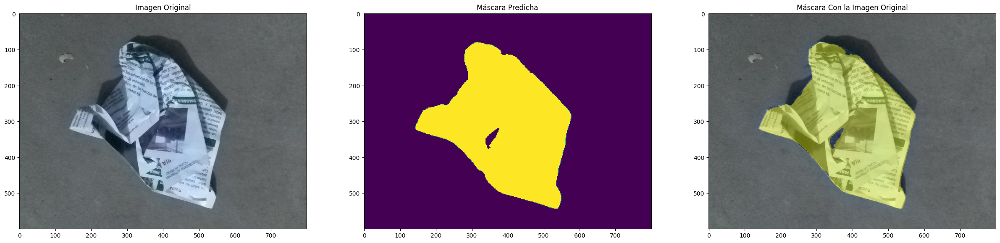

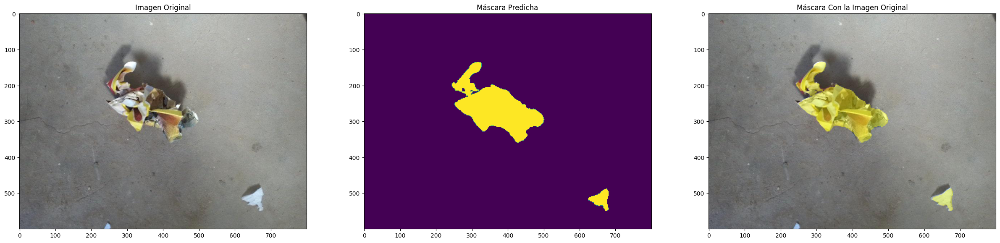

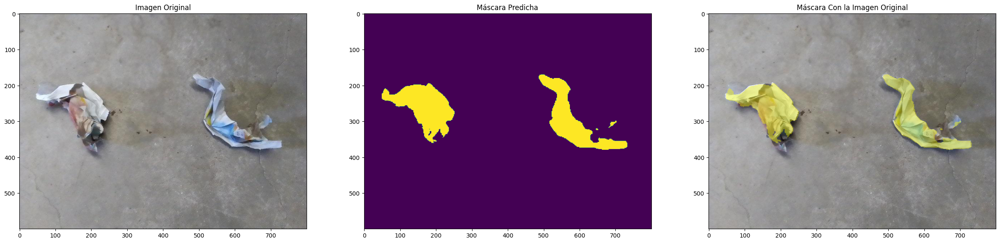

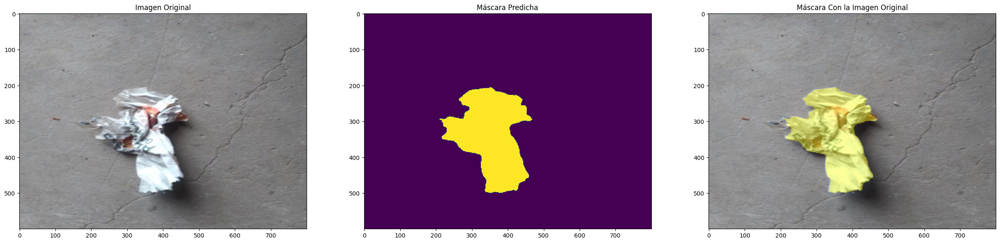

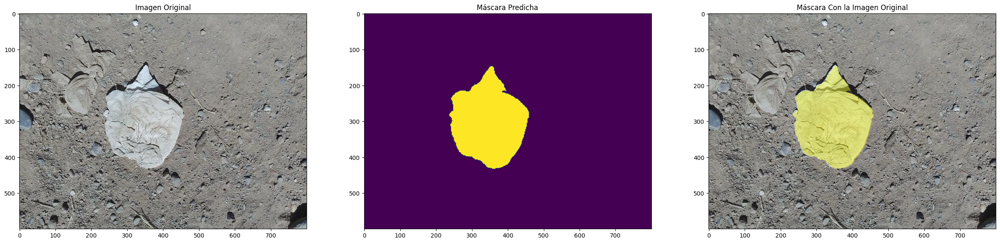

In [ ]:
import random
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Poner el modelo en modo de evaluación
resnet34.eval()

with torch.no_grad():
    for _ in range(5):
        # Obtener un índice aleatorio de la muestra de prueba
        ix = random.randint(0, len(dataset['test']) - 1)

        # Obtener la imagen y la máscara correspondiente al índice seleccionado
        img, _ = dataset['test'][ix]

        # Añadir una dimensión adicional para el lote y enviar la imagen al dispositivo (GPU si está disponible)
        img = img.unsqueeze(0).to(device)

        # Enviar el modelo al dispositivo (GPU si está disponible)
        resnet34 = resnet34.to(device)

        # Redimensionar la imagen de entrada al tamaño deseado
        img_resized = F.interpolate(img, size=(394, 394), mode='bilinear', align_corners=False)

        # Obtener la salida del modelo para la imagen redimensionada
        output = resnet34(img_resized)[0]

        # Obtener la máscara predicha seleccionando la clase con mayor probabilidad
        pred_mask = torch.argmax(output, axis=0)

        # Redimensionar la máscara al tamaño de la imagen original (600x800)
        mask_resized = F.interpolate(pred_mask.unsqueeze(0).unsqueeze(0).float(), size=(600, 800), mode='nearest').squeeze().cpu().numpy()

        # Convertir la imagen y la máscara a NumPy array y transponer los ejes
        img = img.squeeze(0).cpu().numpy().transpose(1, 2, 0)

        # Visualizar la imagen y la máscara predicha
        visualizar_prediccion(img, mask_resized)

# Prueba con imagen de Bolsa 

In [ ]:
import random
import os

def procesar_imagenes(folder_path):
    # Obtener una lista de todos los archivos de imagen en la carpeta
    image_files = os.listdir(folder_path)

    # Seleccionar aleatoriamente 5 índices de las imágenes
    random_indices = random.sample(range(len(image_files)), 5)

    processed_images = []

    for idx in random_indices:
        # Obtener la ruta de la imagen
        image_path = os.path.join(folder_path, image_files[idx])

        # Cargar la imagen
        image_load = Image.open(image_path).convert('RGB')

        # Convertir la imagen a un arreglo NumPy y normalizar los valores en el rango [0, 1]
        image = np.array(image_load) / 255

        # Convertir el arreglo NumPy a un tensor de PyTorch y ajustar las dimensiones
        img = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).to(device)

        # Agregar la imagen procesada a la lista
        processed_images.append(img)

    return processed_images

In [ ]:
def procesar_predicciones(processed_images):
    with torch.no_grad():
        for img_idx in range(5):
            # Obtener la imagen procesada de la lista
            img = processed_images[img_idx].to(device)

            # Redimensionar la imagen
            img_resized = F.interpolate(img, size=(394, 394), mode='bilinear', align_corners=False)
            img_resized = img_resized.float()  # Convertir a torch.cuda.FloatTensor

            # Obtener la salida del modelo
            output = resnet34(img_resized)[0]

            # Obtener la máscara predicha
            pred_mask = torch.argmax(output, axis=0)

            # Redimensionar la máscara al tamaño deseado
            mask_resized = F.interpolate(pred_mask.unsqueeze(0).unsqueeze(0).float(), size=(600, 800), mode='nearest').squeeze().cpu().numpy()

            # Convertir la imagen a un arreglo NumPy y transponer los ejes
            img = img.squeeze(0).cpu().numpy().transpose(1, 2, 0)

            # Redimensionar la imagen a 600x800
            img = Image.fromarray((img * 255).astype(np.uint8))
            img_resized = img.resize((800, 600))
            img_resized = np.array(img_resized) / 255 

            # Visualizar la imagen y la máscara predicha
            visualizar_prediccion(img_resized, mask_resized)


<ipython-input-31-f5466e2ba607>:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_in = torch.tensor(x.clone())


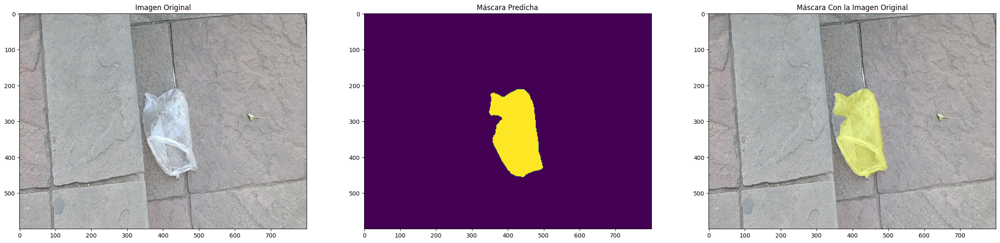

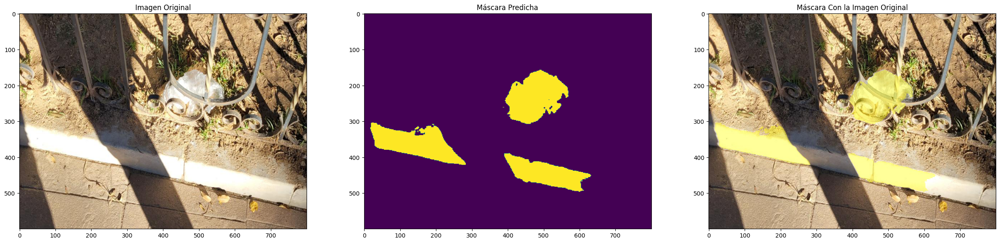

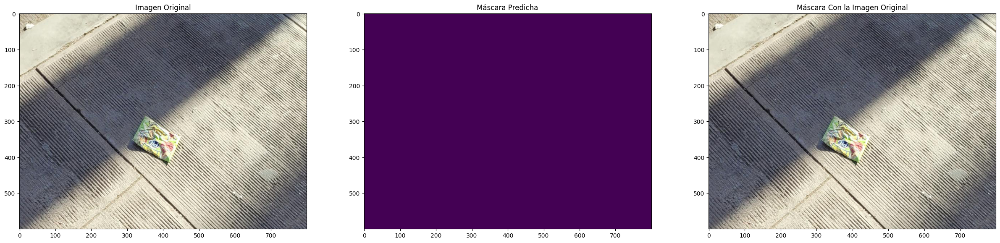

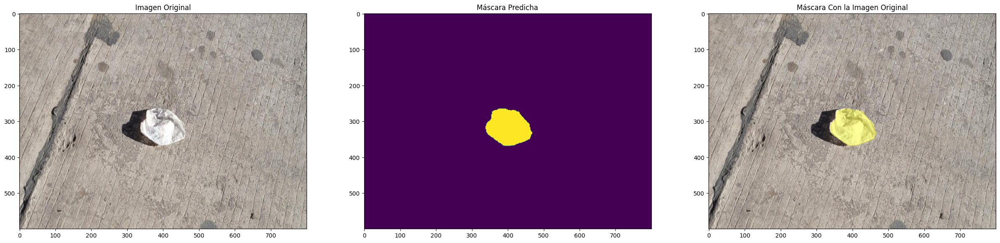

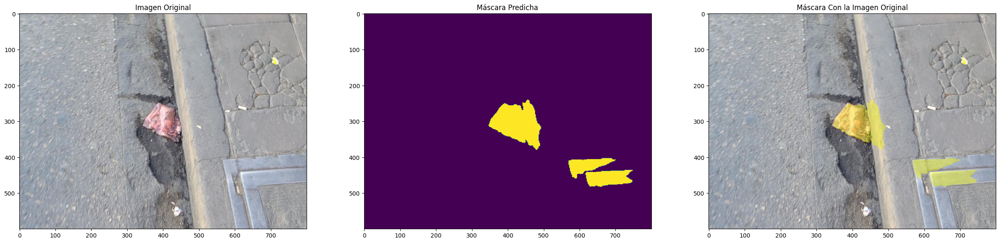

In [ ]:
folder_path = '/content/drive/MyDrive/Data/2doParcial/Data/bolsa'
processed_images = procesar_imagenes(folder_path)
procesar_predicciones(processed_images)

# Prueba con Carton

<ipython-input-31-f5466e2ba607>:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_in = torch.tensor(x.clone())


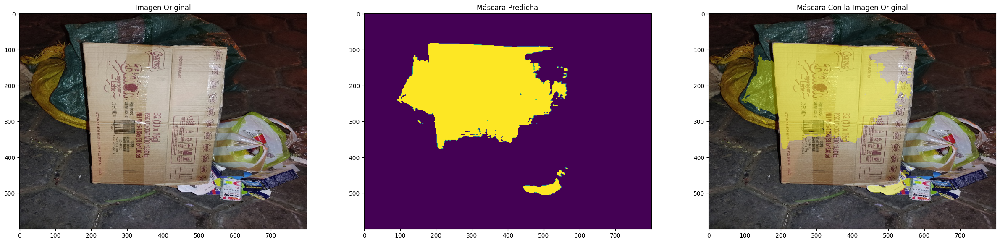

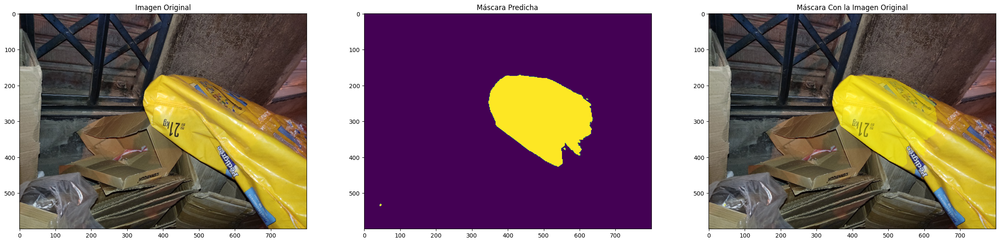

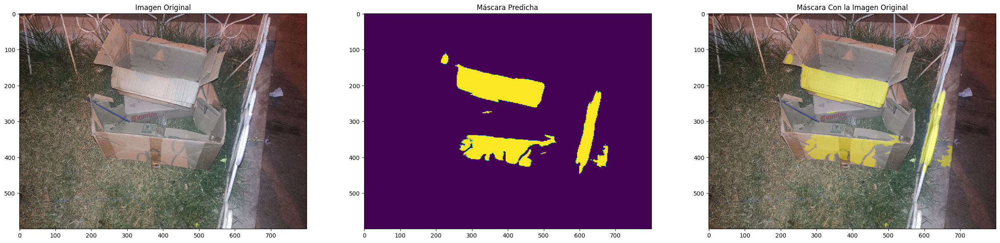

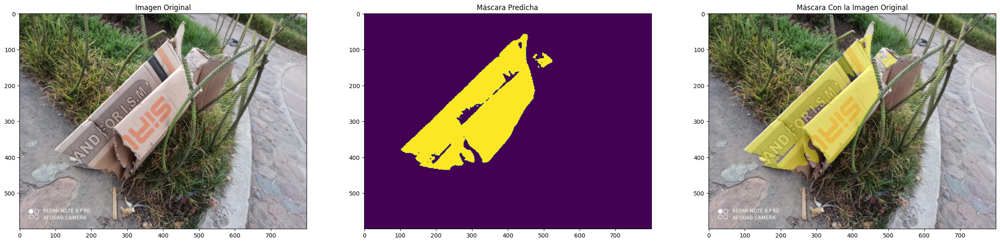

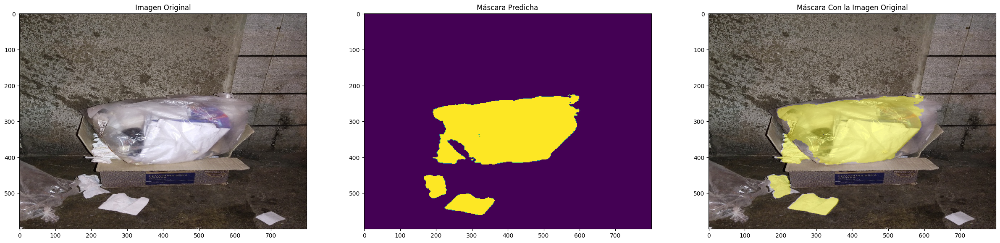

In [ ]:
folder_path = '/content/drive/MyDrive/Data/2doParcial/Data/carton'
processed_images = procesar_imagenes(folder_path)
procesar_predicciones(processed_images)

# Prueba Plastoformo

<ipython-input-31-f5466e2ba607>:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_in = torch.tensor(x.clone())


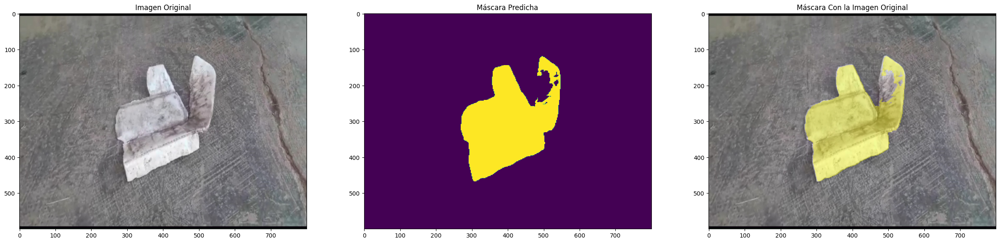

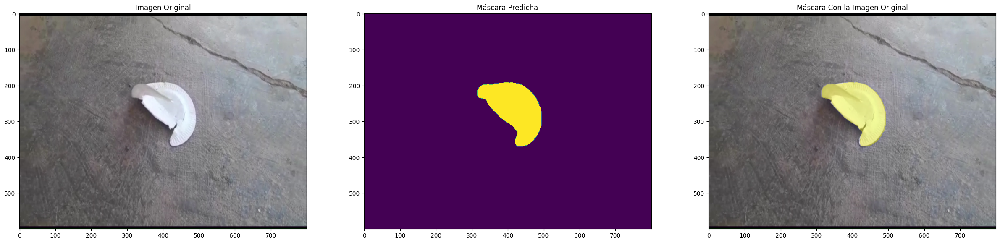

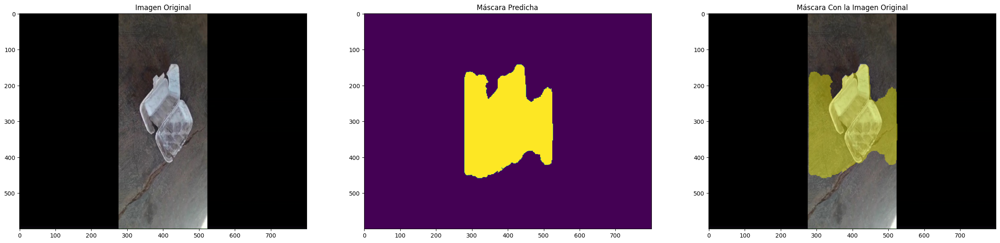

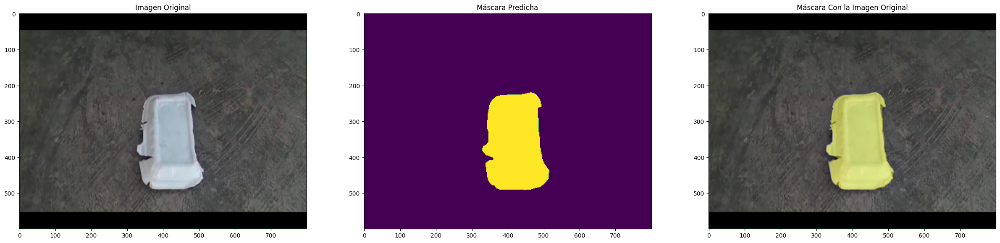

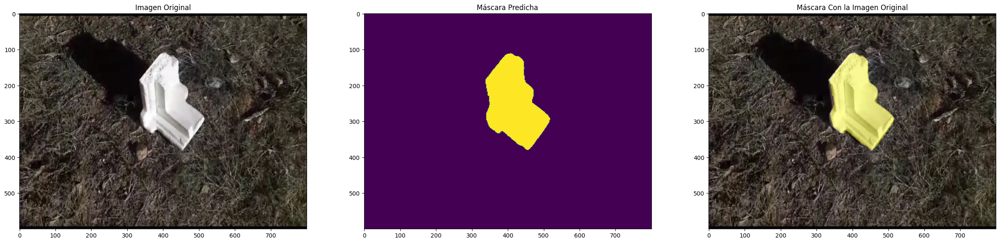

In [ ]:
folder_path = '/content/drive/MyDrive/Data/2doParcial/Data/plastoformo'
processed_images = procesar_imagenes(folder_path)
procesar_predicciones(processed_images)